# **Toronto Urban Heat Island Analysis**

## **Assessing the Relationship Between Median Income and Land Surface Temperature**
---
**Author**: Sebastian Brubaker  
**Date**: May 2025

---

### **Background–Why Identifying and Mitigating Urban Heat Islands Matters**
**The Urban Heat Island (UHI) effect** is a phenomenon where urban environments become significantly warmer than their surroundings and retain high temperatures overnight due to building materials, lack of vegetation and human activity.

UHIs pose **significant risk** to public health, energy consumption, as well as contributing to environmental degradation in urban areas. It has been shown that **socioeconomically disadvantaged areas are disproportionately affected by UHIs** (Sarricolea et al., 2022). These communities often experience systemic inequities rooted in historical and ongoing forms of discrimination, such as redlining, underinvestment, and exclusion from urban planning processes. Furthermore, the UHI effect is exacerbated by the factors composing the socioeconomic disadvantage, such as limited access to healthcare, low income, limited access to greenspace, limited access to air conditioning, etc. Thus, the UHI effect is both a consequence and a driver of **environemntal injustice.**


### **Overview**
**This geospatial analysis assesses if there is a statistically significant correlation between median income and land surface temperature (LST) in the City of Toronto.** It is suspected that as income decreases LST increases. The median income and neighbourhood boundaries datasets are retrieved from the City of Toronto’s Open Data Portal and the LST data will be derived from remotely sensed imagery from Landsat 8-9’s Operational Land Imager and Thermal Infrared Sensor. LST will be summarized by neighbourhood using zonal statistics. Bivariate analysis will be performed between median income and the appropriate LST zonal statistics.



### **Configure Environment**

In [122]:
"""Install libraries"""

# !pip install Pandas
# !pip install GeoPandas
# !pip install matplotlib
# !pip install seaborn
# !pip install scipy
# !pip install rasterio
# !pip install leafmap
# !pip install xarray
# !pip install mapclassify
# !pip install rasterstats
# !pip install localtileserver
# !pip install rioxarray

'Install libraries'

In [123]:
"""Import libraries"""

import pandas as pd
import geopandas as gpd
import re
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
from scipy.stats import shapiro
from scipy.stats import pearsonr
from scipy.stats import spearmanr
import rasterio
from rasterio.mask import mask
import numpy as np
from rasterstats import zonal_stats
import folium
from PIL import Image
import rioxarray as rxr

---
### **Data Processing**
#### **Median Income by Neighbourhood**
The socioeconomic data will be filtered for median income then appended with the neighbourhood boundaries creating one spatial dataset.

---

In [124]:
"""Read the socioeconomic data into a DataFrame and preview the first 10 rows"""

neighbourhood_profiles_df = pd.read_csv("data/socioeconomic/to_nbh_profiles_2021.csv", header = 0)
neighbourhood_profiles_df.head()

,Neighbourhood Name,West Humber-Clairville,Mount Olive-Silverstone-Jamestown,Thistletown-Beaumond Heights,Rexdale-Kipling,Elms-Old Rexdale,Kingsview Village-The Westway,Willowridge-Martingrove-Richview,Humber Heights-Westmount,Edenbridge-Humber Valley,...,Harbourfront-CityPlace,St Lawrence-East Bayfront-The Islands,Church-Wellesley,Downtown Yonge East,Bay-Cloverhill,Yonge-Bay Corridor,Junction-Wallace Emerson,Dovercourt Village,North Toronto,South Eglinton-Davisville
0,Neighbourhood Number,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
1,TSNS 2020 Designation,Not an NIA or Emerging Neighbourhood,Neighbourhood Improvement Area,Neighbourhood Improvement Area,Not an NIA or Emerging Neighbourhood,Neighbourhood Improvement Area,Neighbourhood Improvement Area,Not an NIA or Emerging Neighbourhood,Emerging Neighbourhood,Not an NIA or Emerging Neighbourhood,...,Not an NIA or Emerging Neighbourhood,Not an NIA or Emerging Neighbourhood,Not an NIA or Emerging Neighbourhood,Not an NIA or Emerging Neighbourhood,Not an NIA or Emerging Neighbourhood,Not an NIA or Emerging Neighbourhood,Not an NIA or Emerging Neighbourhood,Not an NIA or Emerging Neighbourhood,Not an NIA or Emerging Neighbourhood,Not an NIA or Emerging Neighbourhood
2,Total - Age groups of the population - 25% sam...,33300,31345,9850,10375,9355,22005,22445,10005,15190,...,28135,31285,22320,17700,16670,12645,23180,12380,15885,22735
3,0 to 14 years,4295,5690,1495,1575,1610,3915,3500,1370,2070,...,2065,2285,895,1055,745,970,3075,1365,1315,2190
4,0 to 4 years,1460,1650,505,505,440,1245,1065,395,520,...,1030,1045,495,480,370,500,1135,445,535,910


In [125]:
"""
Keep only the rows for "Neighbourhood Name", and "Median total income in 2020 among recipients ($)". 
Note, Neigbourhood Number is being dropped as it is not standerdized across datasets and therefore of no use
"""

# Initailize a list of names to keep
row_names = [
    "Median total income in 2020  among recipients ($)",
    "Neighbourhood Name",
    ]

# Create a RegEx for search
pattern = "|".join([re.escape(name) for name in row_names])

# Filter for rows
filtered_df = neighbourhood_profiles_df[
    neighbourhood_profiles_df['Neighbourhood Name'].str.contains(pattern, na=False, regex=True)
]

# Reset the index
filtered_df = filtered_df.reset_index(drop = True)

filtered_df.head()

,Neighbourhood Name,West Humber-Clairville,Mount Olive-Silverstone-Jamestown,Thistletown-Beaumond Heights,Rexdale-Kipling,Elms-Old Rexdale,Kingsview Village-The Westway,Willowridge-Martingrove-Richview,Humber Heights-Westmount,Edenbridge-Humber Valley,...,Harbourfront-CityPlace,St Lawrence-East Bayfront-The Islands,Church-Wellesley,Downtown Yonge East,Bay-Cloverhill,Yonge-Bay Corridor,Junction-Wallace Emerson,Dovercourt Village,North Toronto,South Eglinton-Davisville
0,Median total income in 2020 among recipie...,33600,29600,32800,33600,34400,34400,40800,40400,48400,...,58800,58000,42800,45200,39600,44000,41200,38000,46000,52400


In [126]:
"""Transpose the filtered df"""

transposed_df = filtered_df.T

transposed_df.head()

,0
Neighbourhood Name,Median total income in 2020 among recipie...
West Humber-Clairville,33600
Mount Olive-Silverstone-Jamestown,29600
Thistletown-Beaumond Heights,32800
Rexdale-Kipling,33600


In [127]:
"""Reset the indices and headers"""

transposed_df = transposed_df.reset_index()

transposed_df.columns = transposed_df.iloc[0]
result_df = transposed_df[1:].reset_index(drop = True)

result_df.head()

,Neighbourhood Name,Median total income in 2020 among recipients ($)
0,West Humber-Clairville,33600
1,Mount Olive-Silverstone-Jamestown,29600
2,Thistletown-Beaumond Heights,32800
3,Rexdale-Kipling,33600
4,Elms-Old Rexdale,34400


In [128]:
"""Format the transposed df"""

# Rename
result_df.columns = ["nbh_name", "med_inc"]

# Ensure no whitespace
result_df.columns = result_df.columns.str.strip()

result_df.head()

,nbh_name,med_inc
0,West Humber-Clairville,33600
1,Mount Olive-Silverstone-Jamestown,29600
2,Thistletown-Beaumond Heights,32800
3,Rexdale-Kipling,33600
4,Elms-Old Rexdale,34400


In [129]:
"""As data is being merged by "nbh_name" the strings must be normalized."""

def clean_name(name:str) -> str:
    return re.sub(r'\W+', '', name).lower() # Remove all non-alphanumeric chars and lowercase the string

result_df["mtch_name"] = result_df["nbh_name"].apply(clean_name)

result_df.head()

,nbh_name,med_inc,mtch_name
0,West Humber-Clairville,33600,westhumberclairville
1,Mount Olive-Silverstone-Jamestown,29600,mountolivesilverstonejamestown
2,Thistletown-Beaumond Heights,32800,thistletownbeaumondheights
3,Rexdale-Kipling,33600,rexdalekipling
4,Elms-Old Rexdale,34400,elmsoldrexdale


In [130]:
"""Check for null values"""

print(result_df.isnull().sum())

nbh_name     0
med_inc      0
mtch_name    0
dtype: int64


In [131]:
"""Export to .csv"""

result_df.to_csv("data/socioeconomic/attribute_data.csv", index=False)

In [132]:
"""Open the GeoJSON containing the neighbourhood boundaries"""

geo_df = gpd.read_file("data/socioeconomic/neighbourhood_boundariesWGS84.geojson")

geo_df.to_csv("data/socioeconomic/nbh_bnds_tst.csv")

geo_df.head()

,_id,AREA_ID,AREA_ATTR_ID,PARENT_AREA_ID,AREA_SHORT_CODE,AREA_LONG_CODE,AREA_NAME,AREA_DESC,CLASSIFICATION,CLASSIFICATION_CODE,OBJECTID,geometry
0,1,2502366,26022881,0,174,174,South Eglinton-Davisville,South Eglinton-Davisville (174),Not an NIA or Emerging Neighbourhood,NA,17824737.0,"MULTIPOLYGON (((-79.38635 43.69783, -79.38623 ..."
1,2,2502365,26022880,0,173,173,North Toronto,North Toronto (173),Not an NIA or Emerging Neighbourhood,NA,17824753.0,"MULTIPOLYGON (((-79.39744 43.70693, -79.39837 ..."
2,3,2502364,26022879,0,172,172,Dovercourt Village,Dovercourt Village (172),Not an NIA or Emerging Neighbourhood,NA,17824769.0,"MULTIPOLYGON (((-79.43411 43.66015, -79.43537 ..."
3,4,2502363,26022878,0,171,171,Junction-Wallace Emerson,Junction-Wallace Emerson (171),Not an NIA or Emerging Neighbourhood,NA,17824785.0,"MULTIPOLYGON (((-79.4387 43.66766, -79.43841 4..."
4,5,2502362,26022877,0,170,170,Yonge-Bay Corridor,Yonge-Bay Corridor (170),Not an NIA or Emerging Neighbourhood,NA,17824801.0,"MULTIPOLYGON (((-79.38404 43.64497, -79.38502 ..."


In [133]:
"""Read the median income data into a DataFrame"""

attribute_df = pd.read_csv("data/socioeconomic/attribute_data.csv")

attribute_df.head()

,nbh_name,med_inc,mtch_name
0,West Humber-Clairville,33600,westhumberclairville
1,Mount Olive-Silverstone-Jamestown,29600,mountolivesilverstonejamestown
2,Thistletown-Beaumond Heights,32800,thistletownbeaumondheights
3,Rexdale-Kipling,33600,rexdalekipling
4,Elms-Old Rexdale,34400,elmsoldrexdale


In [134]:
"""Normalize the GeoJSON neighbourhood name formatting for merge"""

def clean_name(name:str) -> str:
    return re.sub(r'\W+', '', name).lower() # Remove all non-alphanumeric chars and lowercase the string

geo_df["mtch_name"] = geo_df["AREA_NAME"].apply(clean_name)
geo_df.head()

,_id,AREA_ID,AREA_ATTR_ID,PARENT_AREA_ID,AREA_SHORT_CODE,AREA_LONG_CODE,AREA_NAME,AREA_DESC,CLASSIFICATION,CLASSIFICATION_CODE,OBJECTID,geometry,mtch_name
0,1,2502366,26022881,0,174,174,South Eglinton-Davisville,South Eglinton-Davisville (174),Not an NIA or Emerging Neighbourhood,NA,17824737.0,"MULTIPOLYGON (((-79.38635 43.69783, -79.38623 ...",southeglintondavisville
1,2,2502365,26022880,0,173,173,North Toronto,North Toronto (173),Not an NIA or Emerging Neighbourhood,NA,17824753.0,"MULTIPOLYGON (((-79.39744 43.70693, -79.39837 ...",northtoronto
2,3,2502364,26022879,0,172,172,Dovercourt Village,Dovercourt Village (172),Not an NIA or Emerging Neighbourhood,NA,17824769.0,"MULTIPOLYGON (((-79.43411 43.66015, -79.43537 ...",dovercourtvillage
3,4,2502363,26022878,0,171,171,Junction-Wallace Emerson,Junction-Wallace Emerson (171),Not an NIA or Emerging Neighbourhood,NA,17824785.0,"MULTIPOLYGON (((-79.4387 43.66766, -79.43841 4...",junctionwallaceemerson
4,5,2502362,26022877,0,170,170,Yonge-Bay Corridor,Yonge-Bay Corridor (170),Not an NIA or Emerging Neighbourhood,NA,17824801.0,"MULTIPOLYGON (((-79.38404 43.64497, -79.38502 ...",yongebaycorridor


In [135]:
"""Merge the two datasets"""

merged_df = geo_df.merge(attribute_df, left_on = "mtch_name", right_on = "mtch_name")

merged_df

,_id,AREA_ID,AREA_ATTR_ID,PARENT_AREA_ID,AREA_SHORT_CODE,AREA_LONG_CODE,AREA_NAME,AREA_DESC,CLASSIFICATION,CLASSIFICATION_CODE,OBJECTID,geometry,mtch_name,nbh_name,med_inc
0,1,2502366,26022881,0,174,174,South Eglinton-Davisville,South Eglinton-Davisville (174),Not an NIA or Emerging Neighbourhood,NA,17824737.0,"MULTIPOLYGON (((-79.38635 43.69783, -79.38623 ...",southeglintondavisville,South Eglinton-Davisville,52400
1,2,2502365,26022880,0,173,173,North Toronto,North Toronto (173),Not an NIA or Emerging Neighbourhood,NA,17824753.0,"MULTIPOLYGON (((-79.39744 43.70693, -79.39837 ...",northtoronto,North Toronto,46000
2,3,2502364,26022879,0,172,172,Dovercourt Village,Dovercourt Village (172),Not an NIA or Emerging Neighbourhood,NA,17824769.0,"MULTIPOLYGON (((-79.43411 43.66015, -79.43537 ...",dovercourtvillage,Dovercourt Village,38000
3,4,2502363,26022878,0,171,171,Junction-Wallace Emerson,Junction-Wallace Emerson (171),Not an NIA or Emerging Neighbourhood,NA,17824785.0,"MULTIPOLYGON (((-79.4387 43.66766, -79.43841 4...",junctionwallaceemerson,Junction-Wallace Emerson,41200
4,5,2502362,26022877,0,170,170,Yonge-Bay Corridor,Yonge-Bay Corridor (170),Not an NIA or Emerging Neighbourhood,NA,17824801.0,"MULTIPOLYGON (((-79.38404 43.64497, -79.38502 ...",yongebaycorridor,Yonge-Bay Corridor,44000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,154,2502213,26022728,0,001,001,West Humber-Clairville,West Humber-Clairville (1),Not an NIA or Emerging Neighbourhood,NA,17827185.0,"MULTIPOLYGON (((-79.59037 43.73401, -79.58942 ...",westhumberclairville,West Humber-Clairville,33600
154,155,2502212,26022727,0,024,024,Black Creek,Black Creek (24),Neighbourhood Improvement Area,NIA,17827201.0,"MULTIPOLYGON (((-79.51915 43.77399, -79.51901 ...",blackcreek,Black Creek,29400
155,156,2502211,26022726,0,023,023,Pelmo Park-Humberlea,Pelmo Park-Humberlea (23),Not an NIA or Emerging Neighbourhood,NA,17827217.0,"MULTIPOLYGON (((-79.53225 43.73505, -79.52938 ...",pelmoparkhumberlea,Pelmo Park-Humberlea,39600
156,157,2502210,26022725,0,022,022,Humbermede,Humbermede (22),Neighbourhood Improvement Area,NIA,17827233.0,"MULTIPOLYGON (((-79.52813 43.74425, -79.52721 ...",humbermede,Humbermede,32400


In [136]:
"""Filter for the unique ids, neighbourhood names, 2020 median income, and geometry fields"""

# Filter 
filtered_df = merged_df[["_id", "nbh_name", "med_inc", "geometry"]]

# Rename unique_id to id
result_df = filtered_df.rename(columns = {"_id": "id"})

result_df

,id,nbh_name,med_inc,geometry
0,1,South Eglinton-Davisville,52400,"MULTIPOLYGON (((-79.38635 43.69783, -79.38623 ..."
1,2,North Toronto,46000,"MULTIPOLYGON (((-79.39744 43.70693, -79.39837 ..."
2,3,Dovercourt Village,38000,"MULTIPOLYGON (((-79.43411 43.66015, -79.43537 ..."
3,4,Junction-Wallace Emerson,41200,"MULTIPOLYGON (((-79.4387 43.66766, -79.43841 4..."
4,5,Yonge-Bay Corridor,44000,"MULTIPOLYGON (((-79.38404 43.64497, -79.38502 ..."
...,...,...,...,...
153,154,West Humber-Clairville,33600,"MULTIPOLYGON (((-79.59037 43.73401, -79.58942 ..."
154,155,Black Creek,29400,"MULTIPOLYGON (((-79.51915 43.77399, -79.51901 ..."
155,156,Pelmo Park-Humberlea,39600,"MULTIPOLYGON (((-79.53225 43.73505, -79.52938 ..."
156,157,Humbermede,32400,"MULTIPOLYGON (((-79.52813 43.74425, -79.52721 ..."


In [137]:
"""Verify geometry and coordinate reference system (CRS)"""

print(result_df.geometry.head())
print(result_df.crs)

0    MULTIPOLYGON (((-79.38635 43.69783, -79.38623 ...
1    MULTIPOLYGON (((-79.39744 43.70693, -79.39837 ...
2    MULTIPOLYGON (((-79.43411 43.66015, -79.43537 ...
3    MULTIPOLYGON (((-79.4387 43.66766, -79.43841 4...
4    MULTIPOLYGON (((-79.38404 43.64497, -79.38502 ...
Name: geometry, dtype: geometry
EPSG:4326


In [138]:
"""Visualize spatial distribution of median income with an interactive map"""

result_df.explore(tooltip=["nbh_name", "med_inc"],
                  column="med_inc",
                  cmap="Greens",
                  legend=True,
                  style_kwds={"color": "black",
                              "weight": 1,
                              "fillOpacity": 0.8,
                              }
                  )

In [139]:
"""Export to a shapefile"""

nbh_map_path = "data/socioeconomic/toronto_nbh_2020.shp"

result_df.to_file(nbh_map_path)

---
### **Derivation of LST**

Note that the LST values represent **surface temperature** and not near surface air temperature. It is also important to note that remotely sensed LST is **derived, not measured** i.e. it is calculated from a combination of measured quantities. Generally speaking, in remote sensing there is always uncertainty and the more a dataset deviates from the original measured values the more uncertainty is introduced. However, recalling the goal is to assess the correlation between two variables, the consistency of the LST calculation is far more important than the precision, i.e. patterns and differences in LST are more important than actual LST values for this analysis.

A general workflow for deriving LST is as follows:
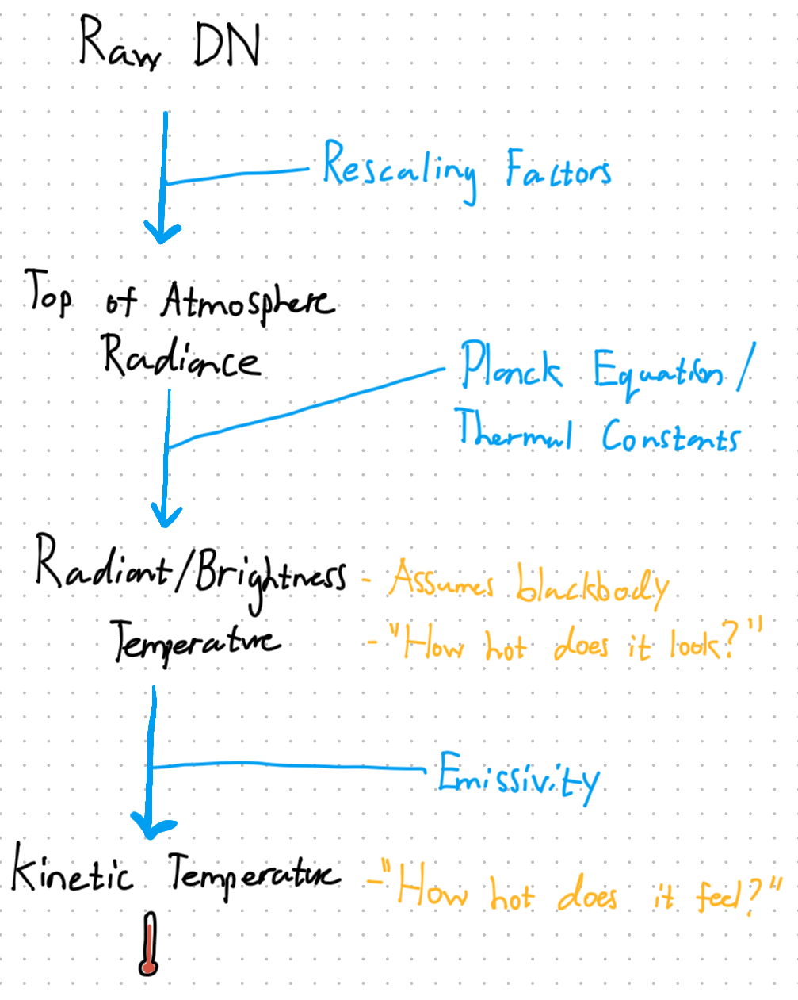


**Radiant temperature** describes the temperature of an object assuming it is a blackbody (perfect emitter), however, a blackbody is a theoretical object, thus radiant temperature rarely ever equals **kinetic temperature**--the actual temperature of an object as measured by a thermometer. The rescaling factors and thermal constants provided in the metadata allow for the calculation of radiant temperature. To bridge the gap from radiant temperature to kinetic temperature emissivity must be accounted for. Emissivity and the Normalized Difference Vegetation Index (NDVI) have been shown to have a high correlation, as such, NDVI will be used to derive emissivity.

Note from the band designation table below that thermal infrared data is collected at $100m$ spatial resolution i.e. each pixel represents the amalgamated electromagnetic energy from a $1000m^2$ area.

#### **Landsat 8-9 Band Designations**
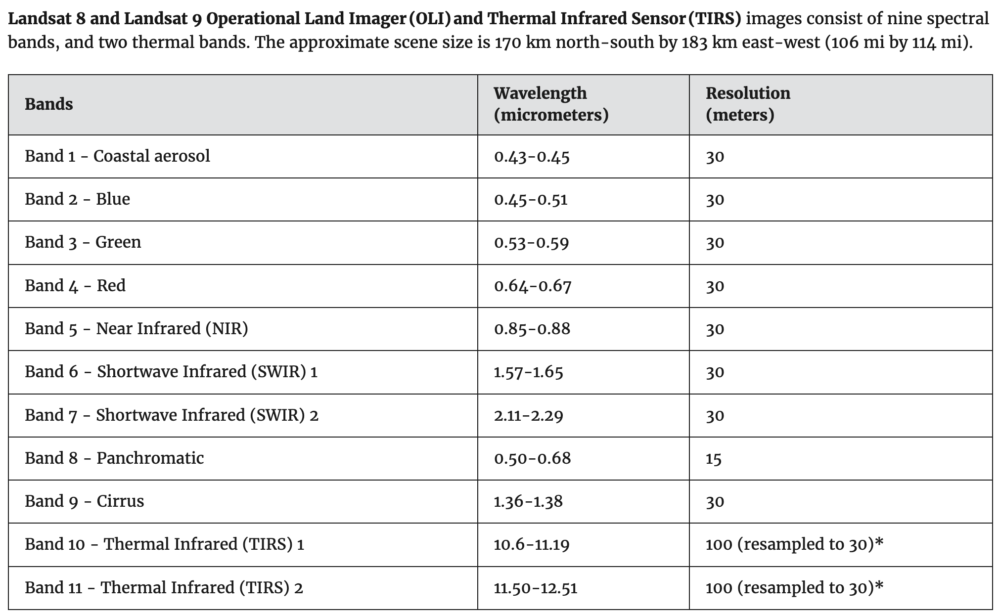

---

In [140]:
"""Define variables for band math"""

# File paths
band2_blue_path = "data/rs/LC08_L1TP_018030_20200702_20200913_02_T1_B2.TIF"
band3_green_path = "data/rs/LC08_L1TP_018030_20200702_20200913_02_T1_B3.TIF"
band4_red_path = "data/rs/LC08_L1TP_018030_20200702_20200913_02_T1_B4.TIF"
band5_nir_path = "data/rs/LC08_L1TP_018030_20200702_20200913_02_T1_B5.TIF"
band10_tir_path = "data/rs/LC08_L1TP_018030_20200702_20200913_02_T1_B10.TIF"

# Rescaling factors retrieved from data/rs/LC08_L1TP_018030_20200702_20200913_02_T1_MTL.txt
rad_add_band10 = 0.1
rad_mlt_band10 = 3.3420e-04

# Thermal constants retrieved from data/rs/LC08_L1TP_018030_20200702_20200913_02_T1_MTL.txt
k1_band10 = 774.8853
k2_band10 = 1321.0789

In [141]:
"""Calculate Top of Atmosphere Radiance (TOA)"""

# Open file and check meta
with rasterio.open(band10_tir_path) as tirs_src:
    band10_tirs = tirs_src.read(1).astype("float32")
    band10_tirs_meta = tirs_src.meta

print(f"Band 10 TIRS meta: {band10_tirs_meta}")

# Calculate
toa = rad_mlt_band10 * band10_tirs + rad_add_band10
type(toa)

Band 10 TIRS meta: {'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 7731, 'height': 7851, 'count': 1, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 17N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-81],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32617"]]'), 'transform': Affine(30.0, 0.0, 456585.0,
       0.0, -30.0, 4899015.0)}


numpy.ndarray

In [142]:
"""Convert TOA to Brightness Temperature (BT)"""

# First to Kelvin
bt_kelvin = k2_band10 / np.log(k1_band10 / toa) + 1 # np.log = ln()

# Convert to Celcius
bt = bt_kelvin - 273.15 

type(bt)

numpy.ndarray

In [143]:
"""Calculate NDVI"""

# Open NIR and Red band files
with rasterio.open(band4_red_path) as red_src:
    band4_red = red_src.read(1).astype("float32")
    meta = red_src.meta.copy()

print(f"Original metadata: {meta}") # For manual inspection

with rasterio.open(band5_nir_path) as nir_src:
    band5_nir = nir_src.read(1).astype("float32")

# Handle zero division error with mask
valid_mask = (band5_nir + band4_red) != 0

ndvi = np.where(valid_mask, 
                (band5_nir - band4_red) / (band5_nir + band4_red), 
                -9999)

# Update metadata for NDVI (float values and nodata)
meta.update({
    "dtype": "float32",
    "nodata": -9999
})

print(f"Updated metadata: {meta}") # For manual inspection

ndvi_path = "data/rs/ndvi.tif"

# Export to GeoTIFF
with rasterio.open(ndvi_path, "w", **meta) as ndvi_dst:
    ndvi_dst.write(ndvi.astype("float32"), 1)

Original metadata: {'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 7731, 'height': 7851, 'count': 1, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 17N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-81],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32617"]]'), 'transform': Affine(30.0, 0.0, 456585.0,
       0.0, -30.0, 4899015.0)}
Updated metadata: {'driver': 'GTiff', 'dtype': 'float32', 'nodata': -9999, 'width': 7731, 'height': 7851, 'count': 1, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 17N",GEOGCS["WGS 84",DAT

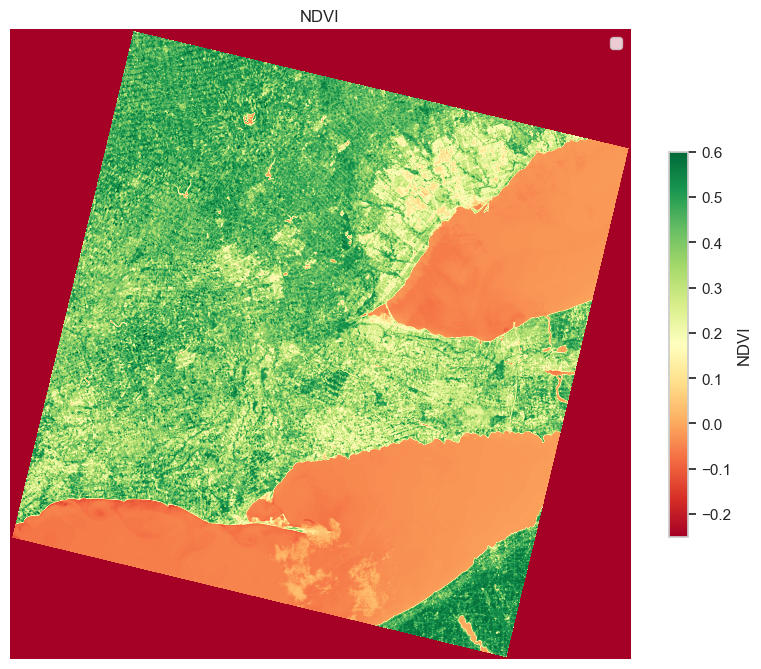

In [144]:
"""Visually assess NDVI map"""

plt.figure(figsize=[10, 10])
plt.title("NDVI")
plt.legend(ndvi)
plt.axis("off")
img = plt.imshow(ndvi, cmap="RdYlGn", vmin=-0.25, vmax=0.6)

cbar = plt.colorbar(img, shrink=0.5)
cbar.set_label("NDVI")

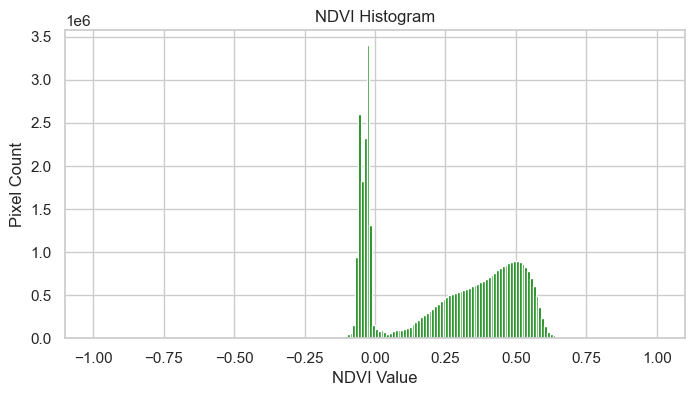

In [145]:
"""Visually assess the NDVI histogram"""

# Mask invalid or nodata values
display_ndvi = np.where(ndvi == -9999, np.nan, ndvi)

# Create Histogram
plt.figure(figsize=(8, 4))
plt.hist(display_ndvi[~np.isnan(ndvi)], bins=200, color='green')
plt.title("NDVI Histogram")
plt.xlabel("NDVI Value")
plt.ylabel("Pixel Count")
plt.grid(True)
plt.show()

In [146]:
"""Calculate Proportion of Vegetation (Pv)"""

# Define max and min NDVI
ndvi_min = -0.17614
ndvi_max = 0.660447

# Calculate Pv
pv = np.square((ndvi - np.absolute(ndvi_min)) / (ndvi_max - np.absolute(ndvi_min)))

type(pv)

numpy.ndarray

In [147]:
"""Calculate Emissivity (E)"""

emis = 0.004 * pv + 0.986

type(emis)

numpy.ndarray

In [148]:
"""Calculate LST"""

# Calculate
lst = bt / (1 + (10.8 * bt / 14388) * np.log(emis))

print(type(lst))

# Update metadata
lst_meta = band10_tirs_meta.copy()

lst_meta.update({
    "dtype": "float32",
    "nodata": -9999
})

print(f"Updated metadata: {lst_meta}")

lst_path = "data/rs/lst.tif"

# Write to file
with rasterio.open(lst_path, "w", **lst_meta) as lst_dst:
    lst_dst.write(lst.astype("float32"), 1)

<class 'numpy.ndarray'>
Updated metadata: {'driver': 'GTiff', 'dtype': 'float32', 'nodata': -9999, 'width': 7731, 'height': 7851, 'count': 1, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 17N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-81],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32617"]]'), 'transform': Affine(30.0, 0.0, 456585.0,
       0.0, -30.0, 4899015.0)}


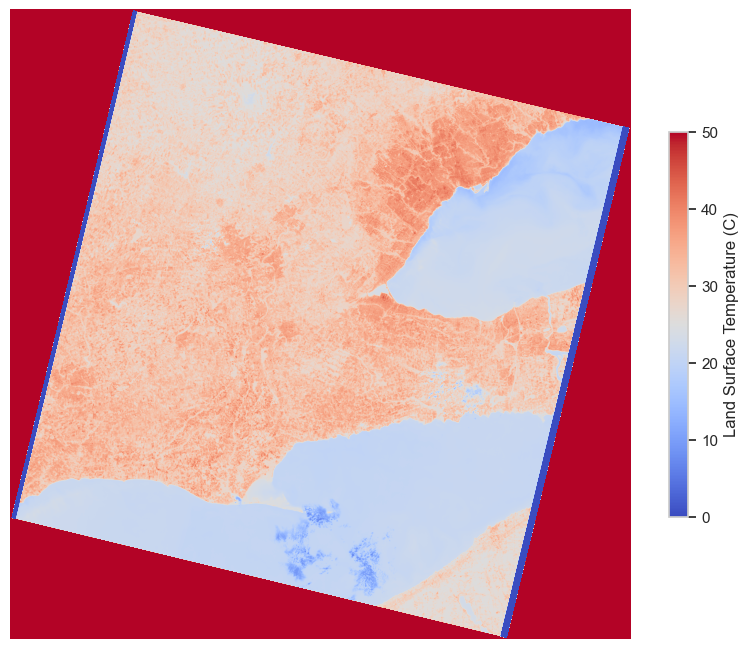

In [149]:
"""Visualize LST"""

plt.figure(figsize=[10, 10])
plt.axis("off")
img = plt.imshow(lst, cmap="coolwarm", vmin=0, vmax=50)

cbar = plt.colorbar(img, shrink=0.5)
cbar.set_label("Land Surface Temperature (C)")

In [150]:
"""Open LST raster data and neighbourhood vector data and configure CRS"""

# Open vector data
nbhs = gpd.read_file(nbh_map_path)
print(f"nbh type: {type(nbhs)}, CRS: {nbhs.crs}")

# Open raster data
lst = rasterio.open(lst_path)
print(f"lst type: {type(lst)}, CRS: {lst.crs}")

# Match CRS
nbhs = nbhs.to_crs(lst.crs)
print(f"CRS match: {nbhs.crs == lst.crs}")

nbh type: <class 'geopandas.geodataframe.GeoDataFrame'>, CRS: EPSG:4326
lst type: <class 'rasterio.io.DatasetReader'>, CRS: EPSG:32617
CRS match: True


In [151]:
"""Extract geometry"""

geometry = nbhs.geometry
geojson_geom = [feature.__geo_interface__ for feature in geometry]

print(type(geojson_geom))

<class 'list'>


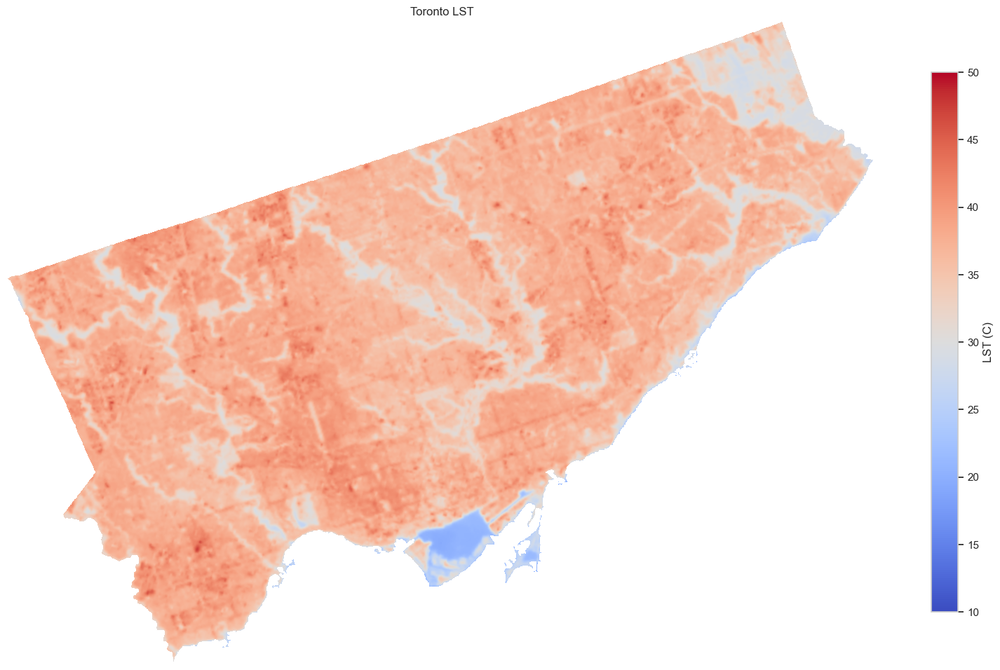

In [152]:
"""Clip the LST raster and visualize"""

clipped_raster, clipped_transform = mask(dataset=lst, shapes=geojson_geom, crop=True)

# Handle nodata values for visualization
display_raster = np.where(clipped_raster == -9999, np.nan, clipped_raster)

plt.figure(figsize=[20, 20])
plt.imshow(display_raster[0], cmap="coolwarm", vmin=10, vmax=50)
plt.colorbar(label="LST (C)", shrink=0.5)
plt.title("Toronto LST")
plt.axis("off")
plt.show()

In [153]:
"""Save the clipped LST raster to a file"""

# Update metadata
out_meta = lst.meta.copy()

out_meta.update({
    "height": clipped_raster.shape[1],
    "width": clipped_raster.shape[2],
    "transform": clipped_transform
})

toronto_lst_path = "data/rs/toronto_lst.tif"

# Write to a .TIF
with rasterio.open(toronto_lst_path, "w", **out_meta) as toronto_lst:
    toronto_lst.write(clipped_raster)

In [154]:
"""Open NDVI raster data and neighbourhood vector data and configure CRS"""

# Open vector data
nbhs = gpd.read_file(nbh_map_path)
print(f"nbh type: {type(nbhs)}, CRS: {nbhs.crs}")

# Open raster data
ndvi = rasterio.open(ndvi_path)
print(f"ndvi type: {type(ndvi)}, CRS: {ndvi.crs}")

# Match CRS
nbhs = nbhs.to_crs(ndvi.crs)
print(f"CRS match: {nbhs.crs == ndvi.crs}")

nbh type: <class 'geopandas.geodataframe.GeoDataFrame'>, CRS: EPSG:4326
ndvi type: <class 'rasterio.io.DatasetReader'>, CRS: EPSG:32617
CRS match: True


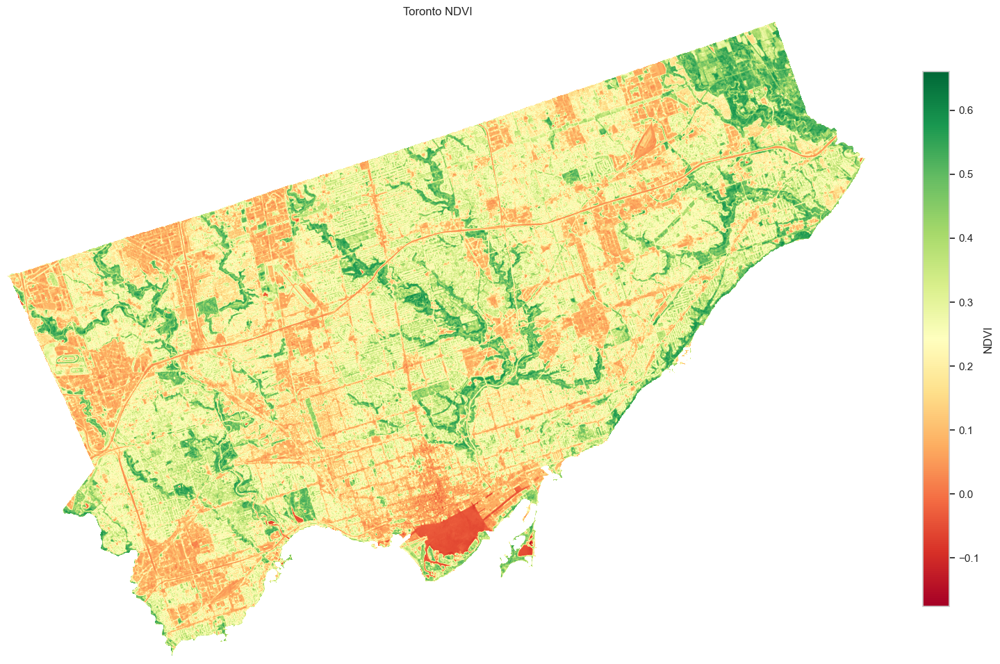

In [155]:
"""Clip the NDVI raster and visualize"""

clipped_raster, clipped_transform = mask(dataset=ndvi, shapes=geojson_geom, crop=True)

# Handle nodata values for visualization
display_raster = np.where(clipped_raster == -9999, np.nan, clipped_raster)

plt.figure(figsize=[20, 20])
plt.imshow(display_raster[0], cmap="RdYlGn", vmin=ndvi_min, vmax=ndvi_max)
plt.colorbar(label="NDVI", shrink=0.5)
plt.title("Toronto NDVI")
plt.axis("off")
plt.show()

In [156]:
"""Save the clipped NDVI raster to a file"""

# Update meta
out_meta = ndvi.meta.copy()

out_meta.update({
    "height": clipped_raster.shape[1],
    "width": clipped_raster.shape[2],
    "transform": clipped_transform
})

toronto_ndvi_path = "data/rs/toronto_ndvi.tif"

# Write to file
with rasterio.open(toronto_ndvi_path, "w", **out_meta) as toronto_ndvi:
    toronto_ndvi.write(clipped_raster)

---

### **Zonal Statistics**
All the data is prepared. LST and NDVI zonal statistics will be extracted and appended to the main dataset.

---

In [157]:
"""Open data and ensure matching CRS"""

nbhs = gpd.read_file(nbh_map_path)

with rasterio.open(toronto_lst_path) as toronto_lst_src:
    toronto_lst_crs = toronto_lst.crs

nbhs = nbhs.to_crs(toronto_lst_crs)

print(toronto_lst_crs == nbhs.crs)

True


In [158]:
"""Calculate zonal statistics and export to geoJSON"""

# Calculate LST zonal stats
stats = zonal_stats(
    nbhs,
    toronto_lst_path,
    stats=["min", "max", "mean", "median", "majority"],
    nodata=-9999,
    geojson_out=True
)

# Change field names
for feature in stats:
    props = feature["properties"]
    props["lst_min"] = props.pop("min")
    props["lst_max"] = props.pop("max")
    props["lst_mean"] = props.pop("mean")
    props["lst_median"] = props.pop("median")
    props["lst_mode"] = props.pop("majority")

# Read to GeoPandas GeoDataFrame
lst_stats = gpd.GeoDataFrame.from_features(stats)

# Reproject and check CRS
lst_stats.set_crs(nbhs.crs, inplace=True)
print(lst_stats.crs)

# Calculate NDVI zonal stats
ndvi_stats_raw = zonal_stats(
    nbhs,
    toronto_ndvi_path,
    stats=["min", "max", "mean", "median", "majority"],
    nodata=-9999,
    geojson_out=False
)

# Add NDVI stats to the same GeoDataFrame
for i, props in enumerate(ndvi_stats_raw):
    lst_stats.loc[i, "ndvi_min"] = props["min"]
    lst_stats.loc[i, "ndvi_max"] = props["max"]
    lst_stats.loc[i, "ndvi_mean"] = props["mean"]
    lst_stats.loc[i, "ndvi_median"] = props["median"]
    lst_stats.loc[i, "ndvi_mode"] = props["majority"]

# Reproject to WGS84
lst_stats.to_crs(epsg=4326)
print(lst_stats.crs)

toronto_inc_lst_path = "data/toronto_inc_lst.geojson"

# Export to GeoJSON
lst_stats.to_file(toronto_inc_lst_path, driver="GeoJSON")

lst_stats.head()

PROJCS["WGS 84 / UTM zone 17N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-81],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32617"]]
PROJCS["WGS 84 / UTM zone 17N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-81],PARAMETER["

,geometry,id,nbh_name,med_inc,lst_min,lst_max,lst_mean,lst_median,lst_mode,ndvi_min,ndvi_max,ndvi_mean,ndvi_median,ndvi_mode
0,"POLYGON ((630028.458 4839577.663, 630038.986 4...",1,South Eglinton-Davisville,52400,33.744450,39.629379,36.327902,36.367973,36.545925,-0.009211,0.520741,0.217415,0.213127,-0.009211
1,"POLYGON ((629115.632 4840570.87, 629041.14 484...",2,North Toronto,46000,34.083881,38.563488,35.930071,35.879845,34.671337,-0.006708,0.428062,0.144093,0.135098,-0.006708
2,"POLYGON ((626258.743 4835318.329, 626158.284 4...",3,Dovercourt Village,38000,34.158615,41.481365,39.320662,39.530499,39.926041,0.011149,0.504825,0.186680,0.175555,0.011149
3,"POLYGON ((625873.19 4836146.058, 625898.171 48...",4,Junction-Wallace Emerson,41200,37.131489,43.251816,40.214606,40.269840,40.123352,0.011513,0.483600,0.156227,0.146283,0.011513
4,"POLYGON ((630329.072 4833709.787, 630250.316 4...",5,Yonge-Bay Corridor,44000,31.586926,39.635574,35.505678,35.670750,35.507446,-0.054280,0.439842,0.067951,0.053026,-0.054280


---

### **Data Analysis**
#### **Data inspection**

---

In [159]:
"""Read the data"""

toronto_inc_lst = gpd.read_file(toronto_inc_lst_path)

toronto_inc_lst.head()

,id,nbh_name,med_inc,lst_min,lst_max,lst_mean,lst_median,lst_mode,ndvi_min,ndvi_max,ndvi_mean,ndvi_median,ndvi_mode,geometry
0,1,South Eglinton-Davisville,52400,33.744450,39.629379,36.327902,36.367973,36.545925,-0.009211,0.520741,0.217415,0.213127,-0.009211,"POLYGON ((630028.458 4839577.663, 630038.986 4..."
1,2,North Toronto,46000,34.083881,38.563488,35.930071,35.879845,34.671337,-0.006708,0.428062,0.144093,0.135098,-0.006708,"POLYGON ((629115.632 4840570.87, 629041.14 484..."
2,3,Dovercourt Village,38000,34.158615,41.481365,39.320662,39.530499,39.926041,0.011149,0.504825,0.186680,0.175555,0.011149,"POLYGON ((626258.743 4835318.329, 626158.284 4..."
3,4,Junction-Wallace Emerson,41200,37.131489,43.251816,40.214606,40.269840,40.123352,0.011513,0.483600,0.156227,0.146283,0.011513,"POLYGON ((625873.19 4836146.058, 625898.171 48..."
4,5,Yonge-Bay Corridor,44000,31.586926,39.635574,35.505678,35.670750,35.507446,-0.054280,0.439842,0.067951,0.053026,-0.054280,"POLYGON ((630329.072 4833709.787, 630250.316 4..."


In [160]:
"""Check the data for nulls and verify types"""

divider = "----------------------------------------------------------------------"

print(toronto_inc_lst.isnull().sum())
print(divider)
print(toronto_inc_lst.describe())
print(divider)
print(toronto_inc_lst.dtypes)


id             0
nbh_name       0
med_inc        0
lst_min        0
lst_max        0
lst_mean       0
lst_median     0
lst_mode       0
ndvi_min       0
ndvi_max       0
ndvi_mean      0
ndvi_median    0
ndvi_mode      0
geometry       0
dtype: int64
----------------------------------------------------------------------
               id       med_inc     lst_min     lst_max    lst_mean  \
count  158.000000    158.000000  158.000000  158.000000  158.000000   
mean    79.500000  41985.443038   30.812587   41.390755   36.760131   
std     45.754781  10216.302857    3.860074    1.733399    1.711383   
min      1.000000  28400.000000   18.035746   38.272873   26.674012   
25%     40.250000  34000.000000   29.717181   40.061166   35.865759   
50%     79.500000  39000.000000   30.920043   41.170923   36.930434   
75%    118.750000  46400.000000   33.471794   42.500403   37.694911   
max    158.000000  74500.000000   37.452763   47.439240   40.214606   

       lst_median    lst_mode    ndvi_

---
#### **Data Exploration**
---

In [ ]:
"""Reproject the LST and NDVI .TIFs and export to .PNG for display in a web map"""

# Open and reproject LST
rds = rxr.open_rasterio(toronto_lst_path, masked=True)
rds = rds.rio.reproject("EPSG:4326")

# Save reprojected LST
rds.rio.to_raster("data/rs/toronto_lst_wgs84.tif")

# Open and reproject NDVI
rds = rxr.open_rasterio(toronto_ndvi_path, masked=True)
rds = rds.rio.reproject("EPSG:4326")

# Save reprojected NDVI
rds.rio.to_raster("data/rs/toronto_ndvi_wgs84.tif")


# Load LST and mask values
with rasterio.open("data/rs/toronto_lst_wgs84.tif") as raster:
    bounds = raster.bounds
    arr = raster.read(1).astype(float)

    vmin, vmax = 10, 50

    # Mask values outside the desired range
    mask = (arr >= vmin) & (arr <= vmax)
    norm_arr = np.clip((arr - vmin) / (vmax - vmin), 0, 1)
    norm_arr[~mask] = np.nan

    # Apply colormap
    cmap = cm.get_cmap("coolwarm")
    rgba = cmap(norm_arr)

    # Set alpha channel to 0 where data is NaN (transparent)
    rgba[..., 3] = np.where(np.isnan(norm_arr), 0, 1)

    # Convert to 8-bit and save
    rgba_uint8 = (rgba * 255).astype(np.uint8)
    img = Image.fromarray(rgba_uint8, mode="RGBA")
    lst_img_path = "figures/clipped_lst_overlay.png"
    img.save(lst_img_path)

# Load NDVI and mask values
with rasterio.open("data/rs/toronto_ndvi_wgs84.tif") as raster:
    bounds = raster.bounds
    arr = raster.read(1).astype(float)

    vmin, vmax = -0.25, 0.6

    # Mask values outside the desired range
    mask = (arr >= vmin) & (arr <= vmax)
    norm_arr = np.clip((arr - vmin) / (vmax - vmin), 0, 1)
    norm_arr[~mask] = np.nan

    # Apply colormap
    cmap = cm.get_cmap("RdYlGn")
    rgba = cmap(norm_arr)

    # Set alpha channel to 0 where data is NaN (transparent)
    rgba[..., 3] = np.where(np.isnan(norm_arr), 0, 1)

    # Convert to 8-bit and save
    rgba_uint8 = (rgba * 255).astype(np.uint8)
    img = Image.fromarray(rgba_uint8, mode="RGBA")
    ndvi_img_path = "figures/clipped_ndvi_overlay.png"
    img.save(ndvi_img_path)


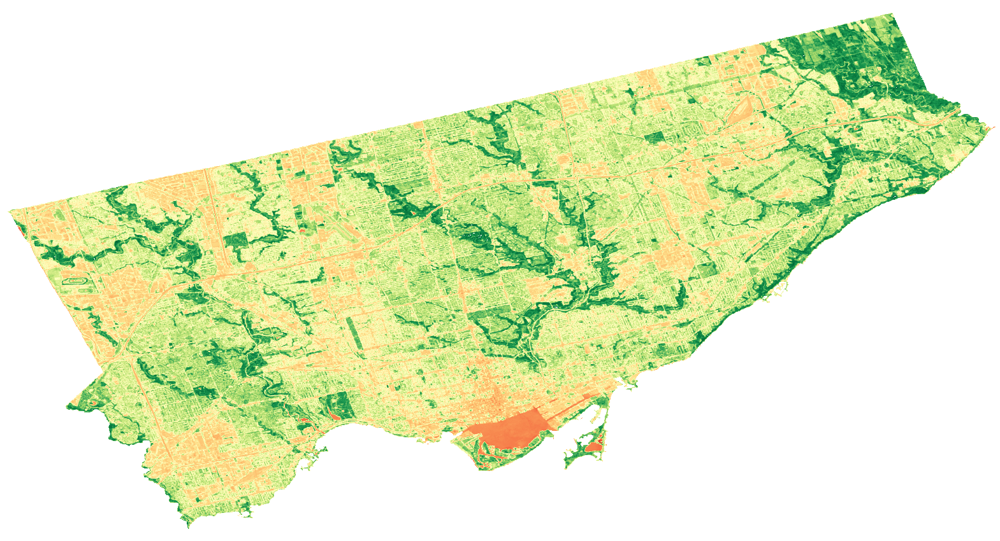
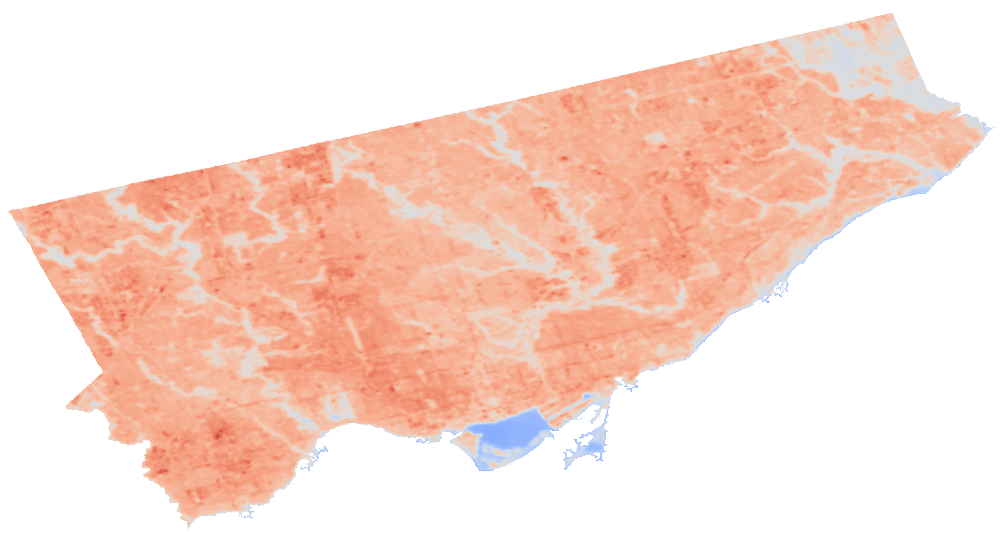

In [ ]:

"""Visualize with a web map"""

# Define bounds and center
image_bounds = [[bounds.bottom, bounds.left], [bounds.top, bounds.right]]
center = [(bounds.top + bounds.bottom)/2, (bounds.left + bounds.right)/2]

# Initialize a map
m = folium.Map(location=center, zoom_start=11)

# Add NDVI image
folium.raster_layers.ImageOverlay(
    image=ndvi_img_path,
    bounds=image_bounds,
    opacity=1.0,
    name="Vegetation",
).add_to(m)

# Add LST image
folium.raster_layers.ImageOverlay(
    image=lst_img_path,
    bounds=image_bounds,
    opacity=1.0,
    name="Land Surface Temperature",
).add_to(m)

# Add neighbourhood data with a tooltip
folium.GeoJson(
    data=toronto_inc_lst,
    name="Neighbourhoods",
    tooltip=folium.GeoJsonTooltip(
        fields=["nbh_name", "med_inc", "lst_mode", "ndvi_mean"],
        aliases=["Neighbourhood:", "Median Income ($):", "LST Mode (C):", "Average NDVI:"],
        localize=True,
        sticky=False,
    ),
    style_function=lambda feature: {
        "fillOpacity": 0.0,
        "color": "black",
        "weight": 1,
    },
).add_to(m)

# Add alyer control
folium.LayerControl().add_to(m)

# Show the map!
m

---

### **Initial Observations**
Upon inspection of the map there appears to be a relationship between median income and land surface temperature. Notice that the cooler neighbourhoods tend to have higher median income and the hotter neighbourhoods tend to have lower median income. Additionally, note the clear relationship between vegetation and land surface temperature, with vegetated areas appearing cooler.

### **Zonal Statistics Insights**
If the relationship between median income and LST is to be assessed numerically we must carefully consider the implications of using each descriptive zonal statistic. Recalling that each $90m^2$ pixel value represents the average LST of a $1000m^2$ area. The **mean LST** describes the average LST of a neighbourhood; averages tend to be sensitive to outliers. In this case an outlier could be a water body or factory pixel. The **LST median** describes the middle $1000m^2$ average LST in a neighbourhood. The **LST mode** describes the most common $1000m^2$ average LST in a neighbourhood i.e. what is the average LST of the majority of the area of the neighbourhood. The **max LST** refers to the hottest $1000m^2$ area in a neighbourhood and the **min LST** refers to the coolest. While Max LST is of interest the $1000m^2$ average LST is likely not a valid descriptor of an entire neighbourhood given their geographic scale. By the same logic neither is min LST.

Note, this dataset has one extreme outlier: the St Lawrence-East Bayfront-The Islands area. This area is predominantly water, as such, it has a very low LST and NDVI.


### **Formulation of Hypothesis**
To assess if there is a statistically significant correlation between median income and LST the main hypothesis will be broken down into sub-hypotheses for each of the appropriate zonal statistics.

#### **Main Hypothesis**
$H_0:$ There is no negative correlation between median income and LST in the City of Toronto.<br>
$H_1:$ There is a negative correlation between median income and LST in the City of Toronto.

#### **Sub-Hypothesis**
$H_0a:$ There is no negative correlation between median income and mean LST.<br>
$H_1a:$ There is a negative correlation between median income and mean LST.

$H_0b:$ There is no negative correlation between median income and median LST.<br>
$H_1b:$ There is a negative correlation between median income and median LST.

$H_0c:$ There is no negative correlation between median income and LST mode.<br>
$H_1c:$ There is a negative correlation between median income and LST mode.

---

### **Analysis of Bivariate Relationships**

#### **Normality Testing**

#### **Median Income Normality**
$H_0$: Median income by neighbourhood is not normally distributed<br>
$H_1$: Median income by neighbourhood is normally distributed

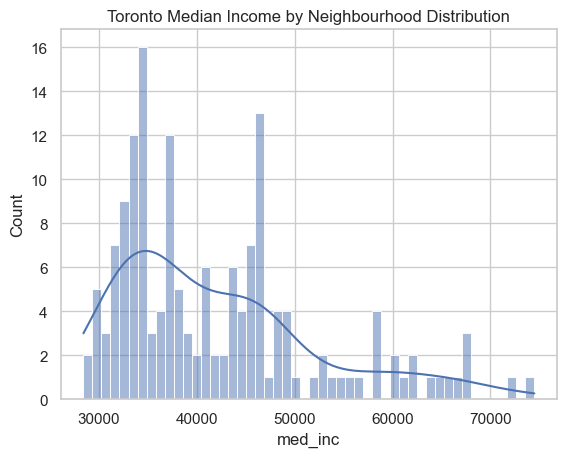

Shapiro-Wilk p-value: 0.000000004208


In [163]:
"""Test median income distribution"""

# Qualitatively with a histogram
sns.histplot(toronto_inc_lst["med_inc"], bins=50, kde=True)
plt.title("Toronto Median Income by Neighbourhood Distribution")
plt.show()

# Quantitatively with the Shapiro-Wilk test
stat, p = shapiro(toronto_inc_lst["med_inc"])
print(f"Shapiro-Wilk p-value: {p:.12f}")

Based on visual assessment of the histogram and a Shapiro-Wilk p-value < 0.05 there is insufficient evidence to reject the null. Therefore, we fail to reject the null, i.e. the **median income by neighbourhood data is likely not normally distributed.** As such, we will need to use a **non-parametric** method for assessing correlation between median income and LST.

---

##### **Mean LST Normality**
$H_0$: Mean LST is not normally distributed.<br>
$H_1$: Mean LST is normally distributed.


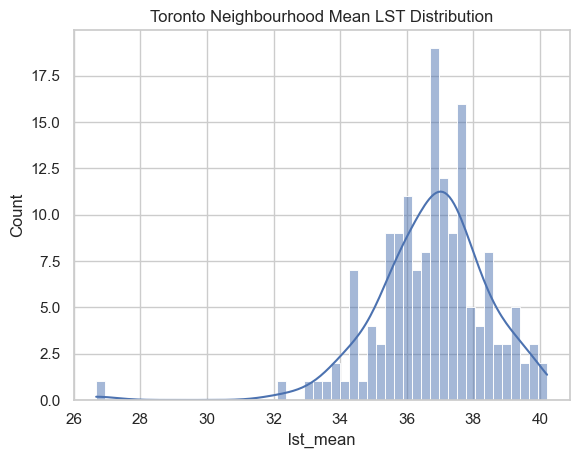

Shapiro-Wilk p-value: 0.000000181941


In [164]:
"""Assess Mean LST distribution"""

# Qualitatively with a histogram
sns.histplot(toronto_inc_lst["lst_mean"], bins=50, kde=True)
plt.title("Toronto Neighbourhood Mean LST Distribution")
plt.show()

# Quantitatively with the Shapiro-Wilk test
stat, p = shapiro(toronto_inc_lst["lst_mean"])
print(f"Shapiro-Wilk p-value: {p:.12f}")

The mean LST data appears normally distributed except for the outlier. When this outlier is removed the Shapiro-Wilk test is satisfied. As the water making up a majority of this neighbourhood is uninhabited the option of discarding the data point can be considered. However, the non-normal distribution of median income requires the use of a non-parametric methods thus, the outlier will not be removed. Therefore, the mean LST will be treated as non-normal. The same reasoning will be applied to LST median and mode.

---

##### **Median LST Normality**

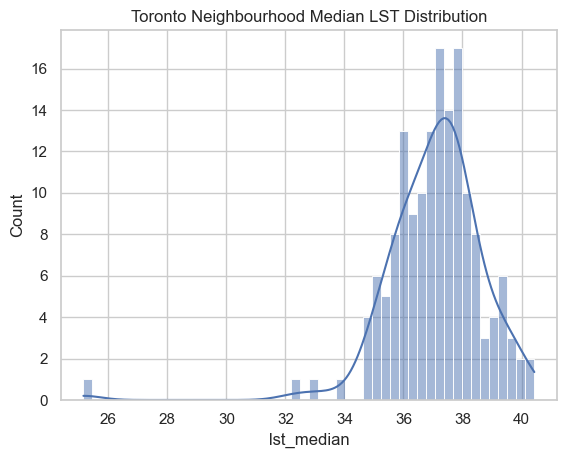

Shapiro-Wilk p-value: 0.000000000028


In [165]:
"""Assess median LST distribution"""

# Qualitatively with a histogram
sns.histplot(toronto_inc_lst["lst_median"], bins=50, kde=True)
plt.title("Toronto Neighbourhood Median LST Distribution")
plt.show()

# Quantitatively with the Shapiro-Wilk test
stat, p = shapiro(toronto_inc_lst["lst_median"])
print(f"Shapiro-Wilk p-value: {p:.12f}")

---

##### **LST Mode Normality**

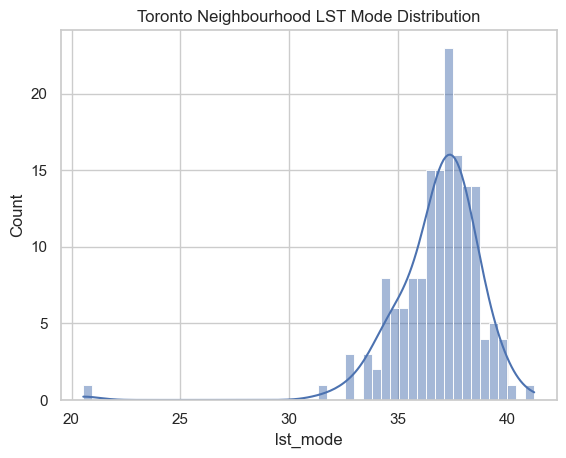

Shapiro-Wilk p-value: 0.000000000000


In [166]:
"""Assess LST mode distribution"""

# Qualitatively with a histogram
sns.histplot(toronto_inc_lst["lst_mode"], bins=50, kde=True)
plt.title("Toronto Neighbourhood LST Mode Distribution")
plt.show()

# Quantitatively with the Shapiro-Wilk test
stat, p = shapiro(toronto_inc_lst["lst_mode"])
print(f"Shapiro-Wilk p-value: {p:.12f}")

**Note,** for each of the following tests the Spearman Correlation will be given precedent as it is non-parametric and the median income data is not normally distributed.

---

##### **Median Income and Mean LST Correlation**
$H_0a:$ There is no negative correlation between median income and mean LST.<br>
$H_1a:$ There is a negative correlation between median income and mean LST.

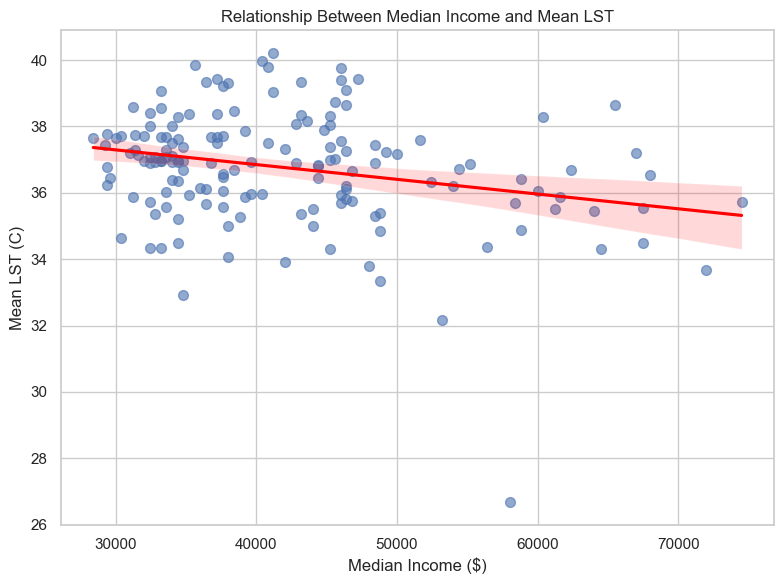

Pearson's r: -0.2649
Pearson's p-value: 0.0008
----------------------------------------------------------------------
Spearman's rank correlation: -0.2227
Spearman's rank p-value: 0.0049


In [167]:
"""Assess median income vs mean LST"""

x="med_inc"
y="lst_mean"

# Create scatterplot with regression line
sns.set_theme(style="whitegrid")
plt.figure(figsize=(8, 6))
sns.regplot(
    data=toronto_inc_lst,
    x=x,
    y=y,
    scatter_kws={"alpha": 0.6, "s": 50},
    line_kws={"color": "red"},
    ci=95
)

plt.xlabel("Median Income ($)")
plt.ylabel("Mean LST (C)")
plt.title("Relationship Between Median Income and Mean LST")
plt.tight_layout()
plt.show()

# Calculate Pearson's r
corr, p = pearsonr(toronto_inc_lst[x], toronto_inc_lst[y])
print(f"Pearson's r: {corr:.4f}")
print(f"Pearson's p-value: {p:.4f}")
print(divider)

# Calculate Spearman's rank correlation
corr, p = spearmanr(toronto_inc_lst[x], toronto_inc_lst[y])
print(f"Spearman's rank correlation: {corr:.4f}")
print(f"Spearman's rank p-value: {p:.4f}")

The scatter plot and correlation coefficients suggest a weak negative correlation between median income and mean LST and with $p < 0.05$ there is sufficient evidence to reject the null hypothesis. That is, there is evidence that higher income neighbourhoods tend to have lower mean LST and vice-versa.

---

##### **Median Income and Median LST**
$H_0b:$ There is no negative correlation between median income and median LST.<br>
$H_1b:$ There is a negative correlation between median income and median LST.

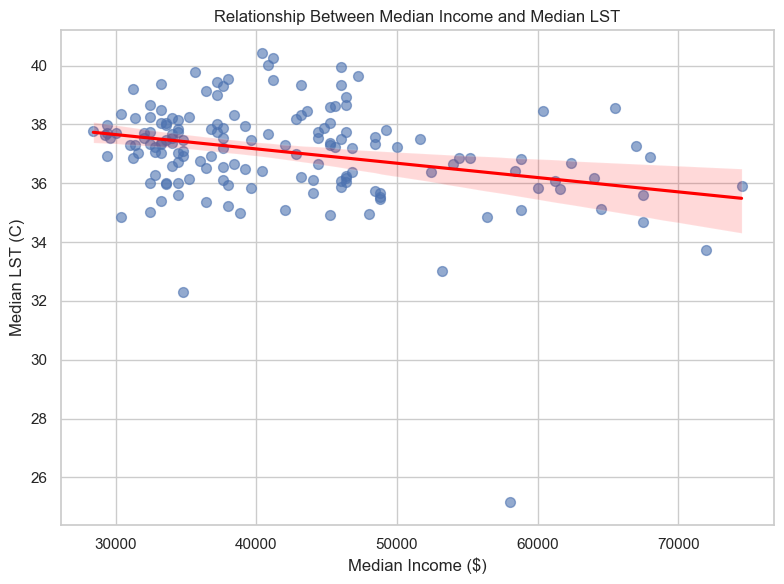

Pearson's r: -0.2961
Pearson's r: 0.0002
----------------------------------------------------------------------
Spearman's rank correlation: -0.2610
Spearman's rank p-value: 0.0009


In [168]:
"""Assess Median Income vs Median LST"""

x="med_inc"
y="lst_median"

# Create scatterplot with regression line
sns.set_theme(style="whitegrid")
plt.figure(figsize=(8, 6))
sns.regplot(
    data=toronto_inc_lst,
    x=x,
    y=y,
    scatter_kws={"alpha": 0.6, "s": 50},
    line_kws={"color": "red"},
    ci=95
)

plt.xlabel("Median Income ($)")
plt.ylabel("Median LST (C)")
plt.title("Relationship Between Median Income and Median LST")
plt.tight_layout()
plt.show()

# Calculate Pearson's r
corr, p = pearsonr(toronto_inc_lst[x], toronto_inc_lst[y])
print(f"Pearson's r: {corr:.4f}")
print(f"Pearson's r: {p:.4f}")
print(divider)

# Calculate Spearman's rank correlation
corr, p = spearmanr(toronto_inc_lst[x], toronto_inc_lst[y])
print(f"Spearman's rank correlation: {corr:.4f}")
print(f"Spearman's rank p-value: {p:.4f}")

The scatter plot and correlation coefficients suggest a weak negative correlation between median income and median LST and with $p < 0.05$ there is sufficient evidence to reject the null hypothesis. That is, there is evidence that higher income neighbourhoods tend to have lower median LST and vice-versa.

---

##### **Median Income and LST Mode**
$H_0c:$ There is no negative correlation between median income and LST mode.<br>
$H_1c:$ There is a negative correlation between median income and LST mode.

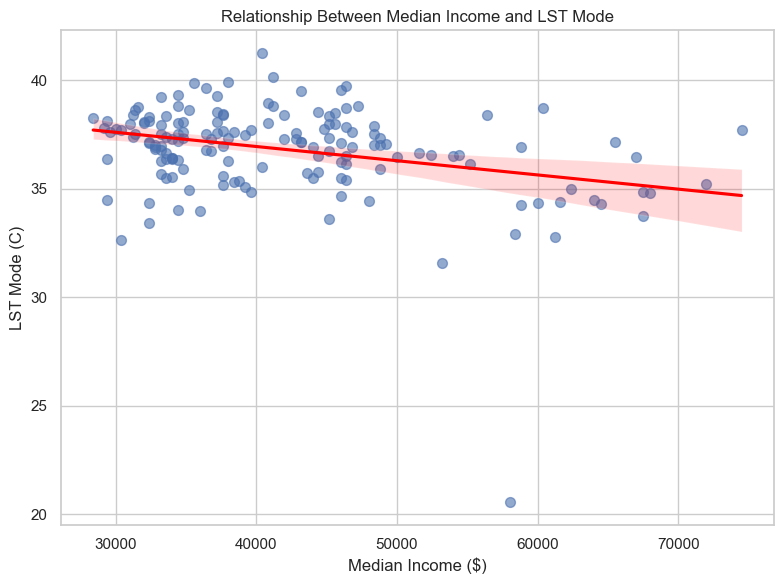

Pearson's r: -0.3189
Pearson's r: 0.0000
----------------------------------------------------------------------
Spearman's rank correlation: -0.2513
Spearman's rank p-value: 0.0014


In [169]:
"""Assess Median Income vs LST Mode"""

x="med_inc"
y="lst_mode"

# Create scatterplot with regression line
sns.set_theme(style="whitegrid")
plt.figure(figsize=(8, 6))
sns.regplot(
    data=toronto_inc_lst,
    x=x,
    y=y,
    scatter_kws={"alpha": 0.6, "s": 50},
    line_kws={"color": "red"},
    ci=95
)

plt.xlabel("Median Income ($)")
plt.ylabel("LST Mode (C)")
plt.title("Relationship Between Median Income and LST Mode")
plt.tight_layout()
plt.show()

# Calculate Pearson's r
corr, p = pearsonr(toronto_inc_lst[x], toronto_inc_lst[y])
print(f"Pearson's r: {corr:.4f}")
print(f"Pearson's r: {p:.4f}")
print(divider)

# Calculate Spearman's rank correlation
corr, p = spearmanr(toronto_inc_lst[x], toronto_inc_lst[y])
print(f"Spearman's rank correlation: {corr:.4f}")
print(f"Spearman's rank p-value: {p:.4f}")

The scatter plot and correlation coefficients suggest a weak negative correlation between median income and LST mode, and with $p < 0.05$ there is sufficient evidence to reject the null hypothesis. That is, there is evidence that higher income neighbourhoods tend to have lower LST mode and vice-versa.

---

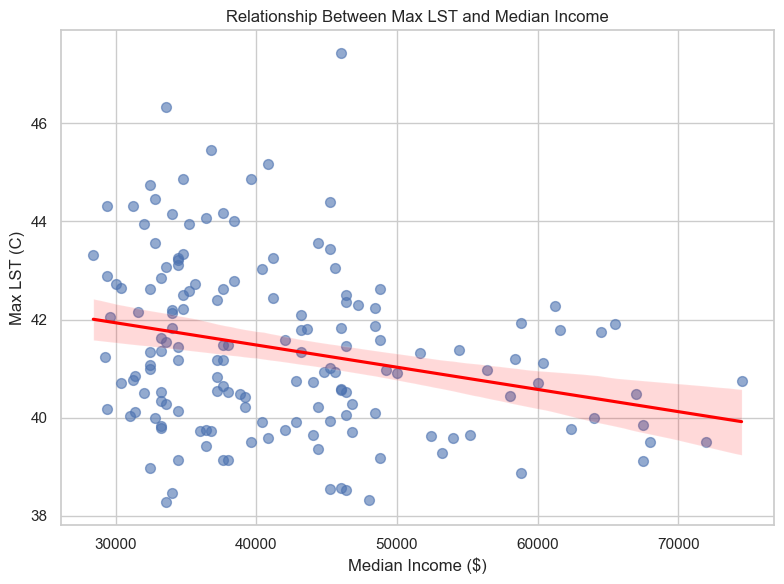

Pearson's r: -0.2670
Pearson's r: 0.0007
----------------------------------------------------------------------
Spearman's rank correlation: -0.2645
Spearman's rank p-value: 0.0008


In [170]:
"""Assess Median Income vs MAx LST"""

x="med_inc"
y="lst_max"

# Create scatterplot with regression line
sns.set_theme(style="whitegrid")
plt.figure(figsize=(8, 6))
sns.regplot(
    data=toronto_inc_lst,
    x=x,
    y=y,
    scatter_kws={"alpha": 0.6, "s": 50},
    line_kws={"color": "red"},
    ci=95
)

plt.xlabel("Median Income ($)")
plt.ylabel("Max LST (C)")
plt.title("Relationship Between Max LST and Median Income")
plt.tight_layout()
plt.show()

# Calculate Pearson's r
corr, p = pearsonr(toronto_inc_lst[x], toronto_inc_lst[y])
print(f"Pearson's r: {corr:.4f}")
print(f"Pearson's r: {p:.4f}")
print(divider)

# Calculate Spearman's rank correlation
corr, p = spearmanr(toronto_inc_lst[x], toronto_inc_lst[y])
print(f"Spearman's rank correlation: {corr:.4f}")
print(f"Spearman's rank p-value: {p:.4f}")

Note that while max LST does show a statistically significant negative correlation, it is of less importance in evaluating the relationship as one pixel is not a stable enough descriptor for an entire neighbourhood.

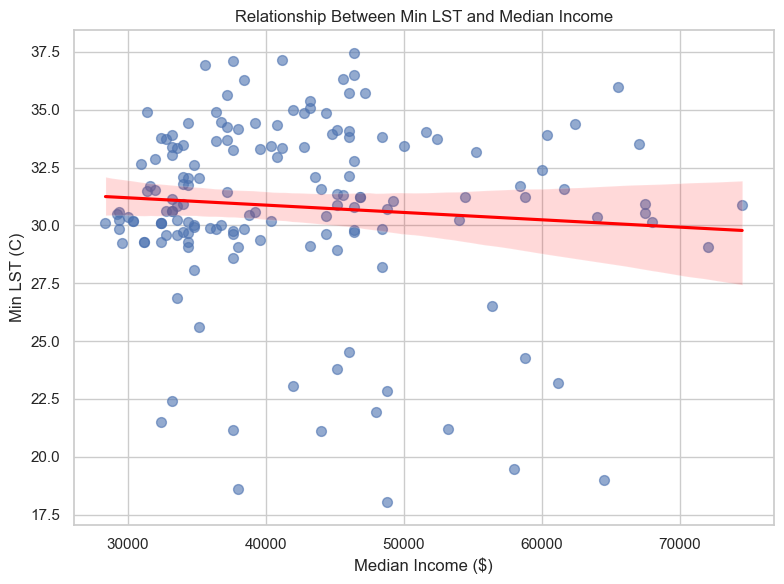

Pearson's r: -0.0840
Pearson's r: 0.2938
----------------------------------------------------------------------
Spearman's rank correlation: 0.0680
Spearman's rank p-value: 0.3958


In [171]:
"""Assess Min LST vs Median Income"""

x="med_inc"
y="lst_min"

# Create scatterplot with regression line
sns.set_theme(style="whitegrid")
plt.figure(figsize=(8, 6))
sns.regplot(
    data=toronto_inc_lst,
    x=x,
    y=y,
    scatter_kws={"alpha": 0.6, "s": 50},
    line_kws={"color": "red"},
    ci=95
)

plt.xlabel("Median Income ($)")
plt.ylabel("Min LST (C)")
plt.title("Relationship Between Min LST and Median Income")
plt.tight_layout()
plt.show()

# Calculate Pearson's r
corr, p = pearsonr(toronto_inc_lst[x], toronto_inc_lst[y])
print(f"Pearson's r: {corr:.4f}")
print(f"Pearson's r: {p:.4f}")
print(divider)

# Calculate Spearman's rank correlation
corr, p = spearmanr(toronto_inc_lst[x], toronto_inc_lst[y])
print(f"Spearman's rank correlation: {corr:.4f}")
print(f"Spearman's rank p-value: {p:.4f}")

The reasoning for not placing significance on min LST is the same as max LST: One pixel is not a stable enough descriptor for an entire neighbourhood.

---

## **Conclusion**
With all the sub-null-hypothesis rejected there is sufficient evidence to reject the main null–“There is no negative correlation between median income and LST in the City of Toronto”. Therefore, we conclude that **lower median income is linked to higher LST in the City of Toronto**.

This finding is more than a statistical relationship, it highlights an environmental justice issue. The disproportionate burden of heat on lower-income neighbourhoods reflects deeper systemic inequities in access to greenspace, urban infrastructure, and cooling resources.

Recognizing this spatial disparity can inform urban planning, climate adaptation strategies, and equity-focused policymaking. Targeted greening efforts, heat mitigation infrastructure, and cooling access programs should prioritize vulnerable areas to build a more climate-resilient city.

---



## **References**
Sarricolea, P., Smith, P., Romero-Aravena, H., Serrano-Notivoli, R., Fuentealba, M., & Meseguer-Ruiz, O. (2022). Socioeconomic inequalities and the surface heat island distribution in Santiago, Chile. The Science of the Total Environment, 832, 155152. https://doi.org/10.1016/j.scitotenv.2022.155152

Toronto, C. O. (2024, August 12). *Open data.* City of Toronto. https://www.toronto.ca/city-government/data-research-maps/open-data/

Urban heat islands and a climate of inequities. (n.d.). https://seas.umich.edu/news/urban-heat-islands-and-climate-inequities-0#:~:text=In%20conclusion%2C%20UHIs%20pose%20a,of%20vulnerable%20populations%20is%20prioritized.

U.S. Geological Survey (n.d.). *EarthExplorer.* https://earthexplorer.usgs.gov/

---

© 2025 Sebastian Brubaker

---